# **Explainable ML & DL Models on Breast Cancer Dataset**

In [ ]:
# importing libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [ ]:
path='breastCancer dataSet.csv'

In [ ]:
# reading csv file

df=pd.read_csv(path)#breastCancer dataSet.csv

In [ ]:
X=df.drop('Class',axis=1)

In [ ]:
for col in X.columns:
    X[col] = pd.to_numeric(X[col],errors='coerce')

In [ ]:
X = X.fillna(0)

In [ ]:
Y=df.Class
Y=Y.replace([2,4],[0,1])

In [ ]:
 df.head()

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2


In [ ]:
 df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699 entries, 0 to 698
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Sample code number           699 non-null    int64 
 1   Clump Thickness              699 non-null    int64 
 2   Uniformity of Cell Size      699 non-null    int64 
 3   Uniformity of Cell Shape     699 non-null    int64 
 4   Marginal Adhesion            699 non-null    int64 
 5   Single Epithelial Cell Size  699 non-null    int64 
 6   Bare Nuclei                  699 non-null    object
 7   Bland Chromatin              699 non-null    int64 
 8   Normal Nucleoli              699 non-null    int64 
 9   Mitoses                      699 non-null    int64 
 10  Class                        699 non-null    int64 
dtypes: int64(10), object(1)
memory usage: 60.2+ KB


In [ ]:
df.shape

(699, 11)

In [ ]:
df.describe()

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bland Chromatin,Normal Nucleoli,Mitoses,Class
count,6.990000e+02,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000
mean,1.071704e+06,4.417740,3.134478,3.207439,2.806867,3.216023,3.437768,2.866953,1.589413,2.689557
std,6.170957e+05,2.815741,3.051459,2.971913,2.855379,2.214300,2.438364,3.053634,1.715078,0.951273
min,6.163400e+04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000
25%,8.706885e+05,2.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,2.000000
50%,1.171710e+06,4.000000,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000,1.000000,2.000000
75%,1.238298e+06,6.000000,5.000000,5.000000,4.000000,4.000000,5.000000,4.000000,1.000000,4.000000
max,1.345435e+07,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,4.000000


In [ ]:
duplicate = df[df.duplicated()]
duplicate

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
208,1218860,1,1,1,1,1,1,3,1,1,2
253,1100524,6,10,10,2,8,10,7,3,3,4
254,1116116,9,10,10,1,10,8,3,3,1,4
258,1198641,3,1,1,1,2,1,3,1,1,2
272,320675,3,3,5,2,3,10,7,1,1,4
338,704097,1,1,1,1,1,1,2,1,1,2
561,1321942,5,1,1,1,2,1,3,1,1,2
684,466906,1,1,1,1,2,1,1,1,1,2


In [ ]:
#Display the Number of Duplicate Rows
df.duplicated().sum()

8

In [ ]:
#Drop all the Duplicate Rows
df.drop_duplicates(inplace = True)

In [ ]:
df.shape

(691, 11)

In [ ]:
#total count of null values in each columns
df.isnull().sum()

Sample code number             0
Clump Thickness                0
Uniformity of Cell Size        0
Uniformity of Cell Shape       0
Marginal Adhesion              0
Single Epithelial Cell Size    0
Bare Nuclei                    0
Bland Chromatin                0
Normal Nucleoli                0
Mitoses                        0
Class                          0
dtype: int64

In [ ]:
# Get the count of malignant and Benign cells
df['Class'].value_counts()

2    453
4    238
Name: Class, dtype: int64

<Axes: ylabel='count'>

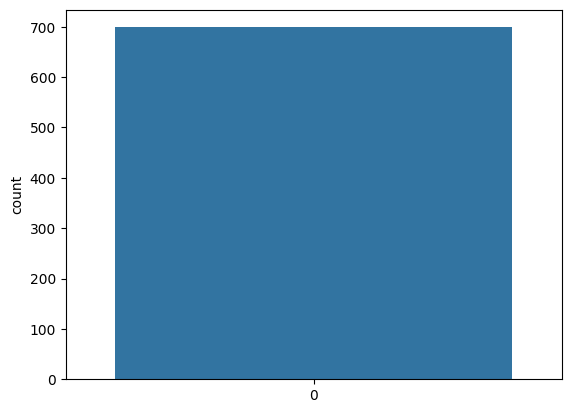

In [ ]:
#visualizing the data
sns.countplot(Y,label="count")

In [ ]:
df.isnull().any()

Sample code number             False
Clump Thickness                False
Uniformity of Cell Size        False
Uniformity of Cell Shape       False
Marginal Adhesion              False
Single Epithelial Cell Size    False
Bare Nuclei                    False
Bland Chromatin                False
Normal Nucleoli                False
Mitoses                        False
Class                          False
dtype: bool

In [ ]:
sns.pairplot(df.iloc[:,1:11])

In [ ]:
df.iloc[:,1:11].corr()

In [ ]:
## visualize the correlation
plt.figure(figsize=(10,10))
sns.heatmap(df.iloc[:,1:11].corr(),annot=True,fmt=".0%")

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.20,random_state=0)

In [ ]:
from sklearn.preprocessing import StandardScaler
X_train=StandardScaler().fit_transform(X_train)
X_test=StandardScaler().fit_transform(X_test)

In [ ]:
X_train.shape

(559, 10)

In [ ]:
sns.set_theme()
sns.set_style('darkgrid')
sns.distplot(Y_train,color='blue')

In [ ]:
X_train

array([[-1.08564892,  2.02838346,  0.2995061 , ..., -0.57777378,
         0.04124139, -0.32425801],
       [ 0.13804167,  1.66945141,  2.25768045, ..., -0.1599529 ,
         0.04124139, -0.32425801],
       [-0.13312821, -1.20200501, -0.67958108, ..., -0.99559467,
        -0.60816532, -0.32425801],
       ...,
       [ 0.38253213, -0.12520886, -0.67958108, ..., -0.99559467,
        -0.60816532, -0.32425801],
       [ 0.62721986,  0.2337232 , -0.67958108, ..., -0.57777378,
        -0.60816532, -0.32425801],
       [-1.4049915 , -1.20200501, -0.67958108, ..., -0.99559467,
        -0.60816532, -0.32425801]])

In [ ]:
# accuracy_score, confusion_matrix, roc_auc_score, roc_curve

from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score

In [ ]:
def kfold(mod,X,Y):
  from sklearn.model_selection import KFold
  from pyparsing import results
  from sklearn.model_selection import cross_val_score
  from sklearn.metrics import accuracy_score
  kfold_validation=KFold(10)
  results=cross_val_score(mod,X,Y,cv=kfold_validation)
  return (np.mean(results))


In [ ]:
def models(X_train,Y_train):

        #logistic regression
        from sklearn.linear_model import LogisticRegression
        log=LogisticRegression(random_state=0)
        log.fit(X_train,Y_train)
        log_pred=log.predict(X_test)



        #Decision Tree
        from sklearn.tree import DecisionTreeClassifier
        tree=DecisionTreeClassifier(random_state=0,criterion="entropy")
        tree.fit(X_train,Y_train)
        tree_pred=tree.predict(X_test)




        #Random Forest
        from sklearn.ensemble import RandomForestClassifier
        forest=RandomForestClassifier(random_state=0,criterion="entropy",n_estimators=10)
        forest.fit(X_train,Y_train)
        forest_pred=forest.predict(X_test)


        # Gaussian Naive Bayes
        from sklearn.naive_bayes import GaussianNB
        gnb=GaussianNB()
        gnb.fit(X_train,Y_train)
        gnb_pred=gnb.predict(X_test)

        # SVM
        from sklearn.svm import SVC
        svc = SVC(kernel='linear')
        svc.fit(X_train, Y_train)
        svc_pred=svc.predict(X_test)

        print('_______________________________________________________')
        print('[0]logistic regression :')
        print ('Accuracy:', accuracy_score(log_pred, Y_test))
        print( 'F1 score:', f1_score(log_pred,Y_test))
        print( 'Recall:', recall_score(log_pred,Y_test))
        print( 'Precision:', precision_score(log_pred,Y_test))
        print( '\n clasification report:\n', classification_report(log_pred,Y_test))
        print( '\n confussion matrix:\n',confusion_matrix(log_pred,Y_test))

        print('_______________________________________________________')
        print('\n[1]Decision tree :')
        print ('Accuracy:', accuracy_score(tree_pred, Y_test))
        print( 'F1 score:', f1_score(tree_pred,Y_test))
        print( 'Recall:', recall_score(tree_pred,Y_test))
        print( 'Precision:', precision_score(tree_pred,Y_test))
        print( '\n clasification report:\n', classification_report(tree_pred,Y_test))
        print( '\n confussion matrix:\n',confusion_matrix(tree_pred,Y_test))


        print('_______________________________________________________')
        print('\n[2]Random forest :')
        print ('Accuracy:', accuracy_score(forest_pred, Y_test))
        print( 'F1 score:', f1_score(forest_pred,Y_test))
        print( 'Recall:', recall_score(forest_pred,Y_test))
        print( 'Precision:', precision_score(forest_pred,Y_test))
        print( '\n clasification report:\n', classification_report(forest_pred,Y_test))
        print( '\n confussion matrix:\n',confusion_matrix(forest_pred,Y_test))


        print('_______________________________________________________')
        print('\n[3]Gaussian Naive Bayes :')
        print ('Accuracy:', accuracy_score(gnb_pred, Y_test))
        print( 'F1 score:', f1_score(gnb_pred,Y_test))
        print( 'Recall:', recall_score(gnb_pred,Y_test))
        print( 'Precision:', precision_score(gnb_pred,Y_test))
        print( '\n clasification report:\n', classification_report(gnb_pred,Y_test))
        print( '\n confussion matrix:\n',confusion_matrix(gnb_pred,Y_test))


        print('_______________________________________________________')
        print('\n[4]SVM :')
        print ('Accuracy:', accuracy_score(svc_pred, Y_test))
        print( 'F1 score:', f1_score(svc_pred,Y_test))
        print( 'Recall:', recall_score(svc_pred,Y_test))
        print( 'Precision:', precision_score(svc_pred,Y_test))
        print( '\n clasification report:\n', classification_report(svc_pred,Y_test))
        print( '\n confussion matrix:\n',confusion_matrix(svc_pred,Y_test))


        return kfold(log,X_train,Y_train), kfold(tree,X_train,Y_train), kfold(forest,X_train,Y_train), kfold(gnb,X_train,Y_train), kfold(svc,X_train,Y_train)


**KFold Accuracy**

In [ ]:
model=models(X_train,Y_train)


_______________________________________________________
[0]logistic regression :
Accuracy: 0.9714285714285714
F1 score: 0.9642857142857142
Recall: 0.9473684210526315
Precision: 0.9818181818181818

 clasification report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.98        83
           1       0.98      0.95      0.96        57

    accuracy                           0.97       140
   macro avg       0.97      0.97      0.97       140
weighted avg       0.97      0.97      0.97       140


 confussion matrix:
 [[82  1]
 [ 3 54]]
_______________________________________________________

[1]Decision tree :
Accuracy: 0.9285714285714286
F1 score: 0.9074074074074073
Recall: 0.9245283018867925
Precision: 0.8909090909090909

 clasification report:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94        87
           1       0.89      0.92      0.91        53

    accuracy                   

**With KFold Accuracy**

In [ ]:
model=list(model)
model

[0.9606818181818182,
 0.9409740259740259,
 0.9606493506493505,
 0.9624675324675325,
 0.9606818181818182]

**Train using Bagging**

In [ ]:
bagging_scores = {}

In [ ]:
def get_bagging_scores(model,x,y):
  from sklearn.ensemble import BaggingClassifier
  bag_model= BaggingClassifier(
    base_estimator=model,
    n_estimators=100,
    max_samples=0.9,
    oob_score=True,
    random_state=0)
  bag_model.fit(x, y)
  return bag_model.oob_score_

In [ ]:
def bag_scores():
  from sklearn.tree import DecisionTreeClassifier
  bagging_scores['tree'] = get_bagging_scores(DecisionTreeClassifier(),X_train, Y_train)

  from sklearn.ensemble import RandomForestClassifier
  bagging_scores['forest'] = get_bagging_scores(RandomForestClassifier(),X_train, Y_train)

  from sklearn.naive_bayes import GaussianNB
  bagging_scores['gauss'] = get_bagging_scores(GaussianNB(),X_train, Y_train)

  from sklearn.svm import SVC
  bagging_scores['svc'] = get_bagging_scores(SVC(),X_train, Y_train)

  from sklearn.linear_model import LogisticRegression
  bagging_scores['log'] = get_bagging_scores(LogisticRegression(),X_train, Y_train)

  print(bagging_scores)

In [ ]:
bag_scores()

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


{'tree': 0.964221824686941, 'forest': 0.9731663685152058, 'gauss': 0.962432915921288, 'svc': 0.964221824686941, 'log': 0.964221824686941}


**best algo**

In [ ]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train,Y_train)
pred = gnb.predict(X_test)

**Boosting**

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import GradientBoostingClassifier
lr_list = [0.05, 0.075, 0.1, 0.25, 0.5, 0.75, 1]

for learning_rate in lr_list:
    gb_clf = GradientBoostingClassifier(n_estimators=20, learning_rate=learning_rate, max_features=2, max_depth=2, random_state=0)
    gb_clf.fit(X_train, Y_train)

    print("Learning rate: ", learning_rate)
    print("Accuracy score (training): {0:.3f}".format(gb_clf.score(X_train, Y_train)))
    print("Accuracy score (validation): {0:.3f}".format(gb_clf.score(X_test, Y_test)))

Learning rate:  0.05
Accuracy score (training): 0.966
Accuracy score (validation): 0.964
Learning rate:  0.075
Accuracy score (training): 0.971
Accuracy score (validation): 0.964
Learning rate:  0.1
Accuracy score (training): 0.973
Accuracy score (validation): 0.971
Learning rate:  0.25
Accuracy score (training): 0.973
Accuracy score (validation): 0.971
Learning rate:  0.5
Accuracy score (training): 0.982
Accuracy score (validation): 0.971
Learning rate:  0.75
Accuracy score (training): 0.995
Accuracy score (validation): 0.979
Learning rate:  1
Accuracy score (training): 0.998
Accuracy score (validation): 0.957


**We're mainly interested in the classifier's accuracy on the validation set, but it looks like a learning rate of 0.75 gives us the best performance on the validation set and good performance on the training set.**

In [ ]:
gb_clf2 = GradientBoostingClassifier(n_estimators=20, learning_rate=0.75, max_features=2, max_depth=2, random_state=0)
gb_clf2.fit(X_train, Y_train)
predictions = gb_clf2.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(Y_test, predictions))

print("Classification Report")
print(classification_report(Y_test, predictions))

Confusion Matrix:
[[83  2]
 [ 1 54]]
Classification Report
              precision    recall  f1-score   support

           0       0.99      0.98      0.98        85
           1       0.96      0.98      0.97        55

    accuracy                           0.98       140
   macro avg       0.98      0.98      0.98       140
weighted avg       0.98      0.98      0.98       140



**Hyperparameter tunning**

---



In [ ]:
best_score_vals = {}
best_params = {}

In [ ]:
def do_grid_search(model, param):
  from sklearn.model_selection import GridSearchCV

  grid_search = GridSearchCV(model, param, cv=10,verbose=1,n_jobs=-1)      #................

  grid_search.fit(X_train,Y_train)

  return grid_search.best_params_, grid_search.best_score_

In [ ]:
def grid_search_val():

  from sklearn.ensemble import RandomForestClassifier
  p1 = {'n_estimators':np.arange(5,100,5), 'max_features':np.arange(0.1,1.0,0.05)}
  forest = do_grid_search(RandomForestClassifier(random_state=0),p1)
  best_params['forest'] = forest[0]
  best_score_vals['forest'] = forest[1]

  from sklearn.tree import DecisionTreeClassifier
  p2 = {'criterion':['gini','entropy'],
        'max_depth':range(1,10)}
  tree =  do_grid_search(DecisionTreeClassifier(),p2)
  best_params['tree'] = tree[0]
  best_score_vals['tree'] = tree[1]

  from sklearn.linear_model import LogisticRegression
  p3 = {'C': np.logspace(-4, 4, 50)}
  log =  do_grid_search(LogisticRegression(),p3)
  best_params['log'] = log[0]
  best_score_vals['log'] = log[1]

  from sklearn.naive_bayes import GaussianNB
  p4 = {
      'var_smoothing': range(1,5)
  }
  gnb =  do_grid_search(GaussianNB(),p4)
  best_params['gnb'] = gnb[0]
  best_score_vals['gnb'] = gnb[1]

  from sklearn.svm import SVC
  p5 = {
      'C':[0.9],
      'kernel':['rbf','linear','sigmoid']
  }
  sv =  do_grid_search(SVC(),p5)
  best_params['sv'] = sv[0]
  best_score_vals['sv'] = sv[1]

  print("...............Best Parameters...............")
  print(best_params)
  print("............Best score values...............")
  print(best_score_vals)

In [ ]:
grid_search_val()

Fitting 10 folds for each of 342 candidates, totalling 3420 fits
Fitting 10 folds for each of 18 candidates, totalling 180 fits
Fitting 10 folds for each of 50 candidates, totalling 500 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
...............Best Parameters...............
{'forest': {'max_features': 0.1, 'n_estimators': 35}, 'tree': {'criterion': 'entropy', 'max_depth': 3}, 'log': {'C': 0.12648552168552957}, 'gnb': {'var_smoothing': 1}, 'sv': {'C': 0.9, 'kernel': 'rbf'}}
............Best score values...............
{'forest': 0.975, 'tree': 0.9463311688311687, 'log': 0.9642532467532469, 'gnb': 0.9463311688311687, 'sv': 0.9642532467532468}


In [ ]:
from sklearn.svm import SVC
SVC().get_params().keys()

dict_keys(['C', 'break_ties', 'cache_size', 'class_weight', 'coef0', 'decision_function_shape', 'degree', 'gamma', 'kernel', 'max_iter', 'probability', 'random_state', 'shrinking', 'tol', 'verbose'])

In [ ]:
# Grid Search

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
grid_search = GridSearchCV(RandomForestClassifier(random_state=0),
                           {
                              'n_estimators':np.arange(5,100,5),
                              'max_features':np.arange(0.1,1.0,0.05),

                            },cv=10, scoring="r2",verbose=1,n_jobs=-1
                           )
grid_search.fit(X_test,Y_test)



Fitting 10 folds for each of 342 candidates, totalling 3420 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=0), n_jobs=-1,
             param_grid={'max_features': array([0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55, 0.6 ,
       0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95]),
                         'n_estimators': array([ 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85,
       90, 95])},
             scoring='r2', verbose=1)

In [ ]:
grid_search.best_params_

{'max_features': 0.1, 'n_estimators': 20}

In [ ]:
grid_search.best_score_

0.908611111111111

In [ ]:
#Confusion matrix

cf = confusion_matrix(pred, Y_test)
print(cf)

[[80  1]
 [ 5 54]]


In [ ]:
# ROC CURVE

def plot_roc(true_y, y_prob):
  fpr, tpr, thresholds = roc_curve(true_y, y_prob)
  plt.plot(fpr, tpr)
  plt.xlabel('false rate')
  plt.ylabel('tuie rate')

model AUC score: 0.9514542791378948


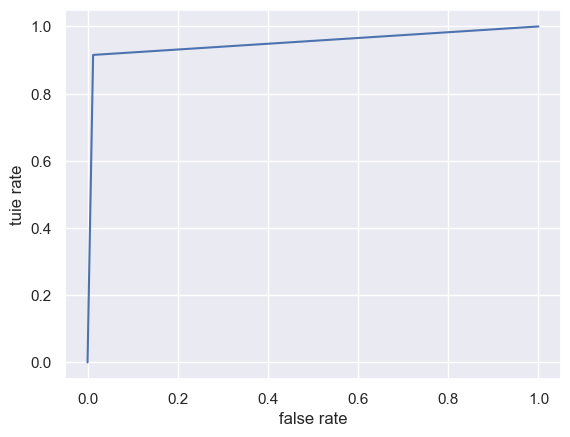

In [ ]:
# AUC CURVE
plot_roc(pred,Y_test)
print(f'model AUC score: {roc_auc_score(pred,Y_test)}')

In [ ]:
# precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score

from sklearn.metrics import precision_score, \
    recall_score, confusion_matrix, classification_report, \
    accuracy_score, f1_score

print ('Accuracy:', accuracy_score(pred, Y_test))
print( 'F1 score:', f1_score(pred,Y_test))
print( 'Recall:', recall_score(pred,Y_test))
print( 'Precision:', precision_score(pred,Y_test))
print( '\n clasification report:\n', classification_report(pred,Y_test))
print( '\n confussion matrix:\n',confusion_matrix(pred,Y_test))

Accuracy: 0.9571428571428572
F1 score: 0.9473684210526316
Recall: 0.9152542372881356
Precision: 0.9818181818181818

 clasification report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96        81
           1       0.98      0.92      0.95        59

    accuracy                           0.96       140
   macro avg       0.96      0.95      0.96       140
weighted avg       0.96      0.96      0.96       140


 confussion matrix:
 [[80  1]
 [ 5 54]]


In [ ]:
import pandas as pd

In [ ]:
path='breastCancer dataSet.csv'

In [ ]:
df = pd.read_csv(path)

In [ ]:
X=df.drop('Class',axis=1)
X=X.drop('Sample code number',axis=1)
Y=df['Class']
X=X.replace('?',0)
Y=Y.replace([2,4],[0,1])

In [ ]:
for col in X.columns:
    X[col] = pd.to_numeric(X[col])
    X[col] = X[col].fillna(0)

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.20,random_state=0)

In [ ]:
# from sklearn.preprocessing import StandardScaler
# X_train=StandardScaler().fit_transform(X_train)
# X_test=StandardScaler().fit_transform(X_test)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
forest=RandomForestClassifier(random_state=0,criterion="entropy",n_estimators=10)
forest.fit(X_train,Y_train)
forest_pred=forest.predict(X_test)

# **SHAP**

In [ ]:
!pip install shap
import shap

In [ ]:
rf_shap_values = shap.KernelExplainer(forest.predict,X_test)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names
Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [ ]:
values=rf_shap_values.shap_values(X_test)

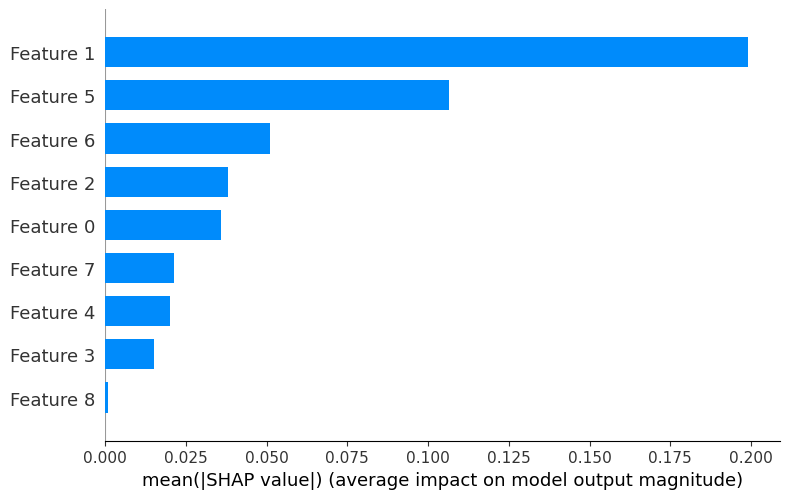

In [ ]:
shap.summary_plot(values, X_test, plot_type='bar')

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


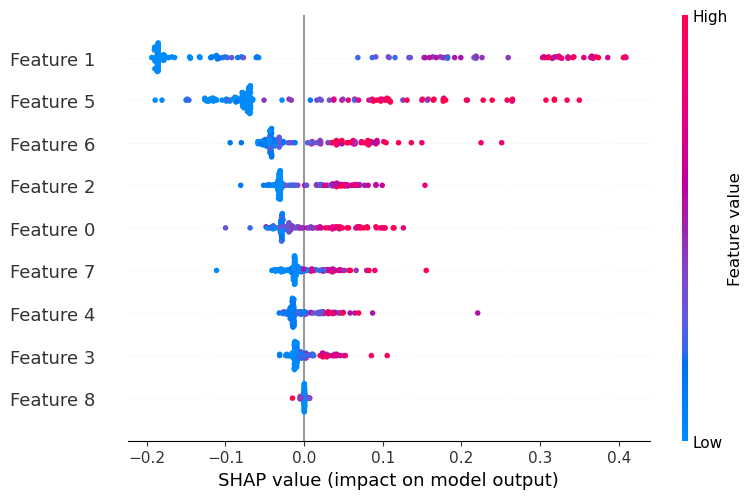

In [ ]:
shap.summary_plot(values, X_test)

In [ ]:
shap.force_plot(rf_shap_values.expected_value,values,X_test)

In [ ]:
X_test.columns

Index(['Clump Thickness', 'Uniformity of Cell Size',
       'Uniformity of Cell Shape', 'Marginal Adhesion',
       'Single Epithelial Cell Size', 'Bare Nuclei ', 'Bland Chromatin ',
       'Normal Nucleoli', 'Mitoses'],
      dtype='object')

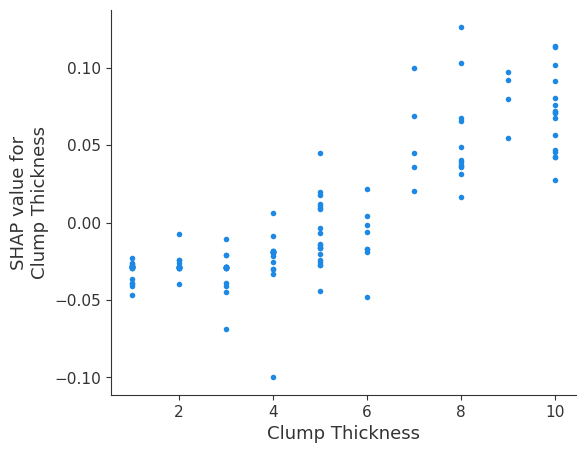

In [ ]:
shap.dependence_plot("Clump Thickness",values, X_test, interaction_index=None)

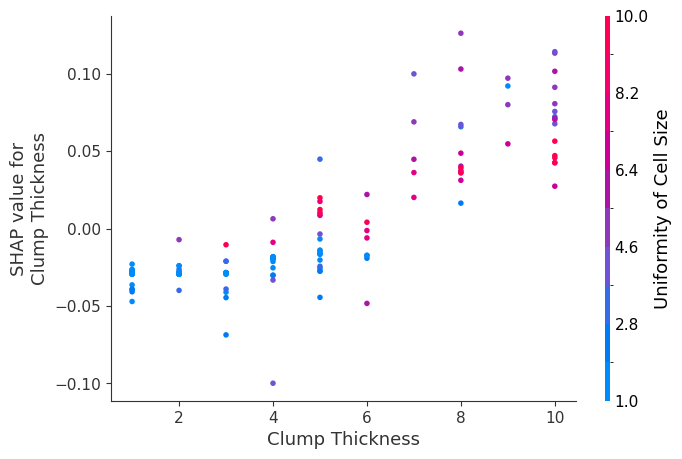

In [ ]:
shap.dependence_plot("Clump Thickness",values, X_test, interaction_index="auto")

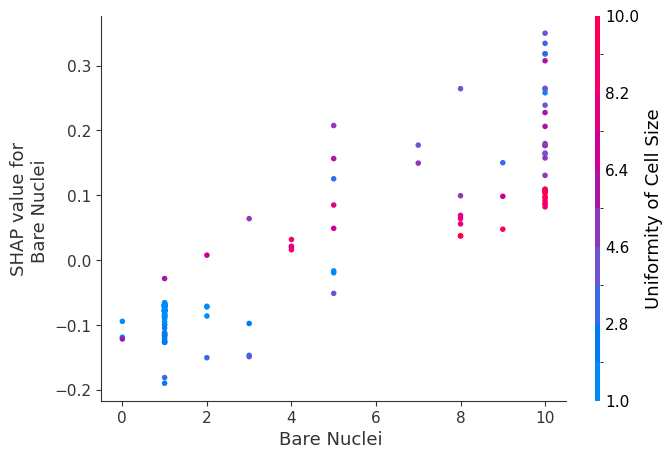

In [ ]:
shap.dependence_plot("Bare Nuclei ",values, X_test, interaction_index="auto")

In [ ]:
shap.initjs()

In [ ]:
from sklearn.tree import DecisionTreeClassifier
tree=DecisionTreeClassifier(random_state=0,criterion="entropy")
tree.fit(X_train,Y_train)

DecisionTreeClassifier(criterion='entropy', random_state=0)

In [ ]:
tree_shap_values = shap.KernelExplainer(tree.predict,X_test)

Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [ ]:
values=tree_shap_values.shap_values(X_test)

  0%|          | 0/140 [00:00<?, ?it/s]

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


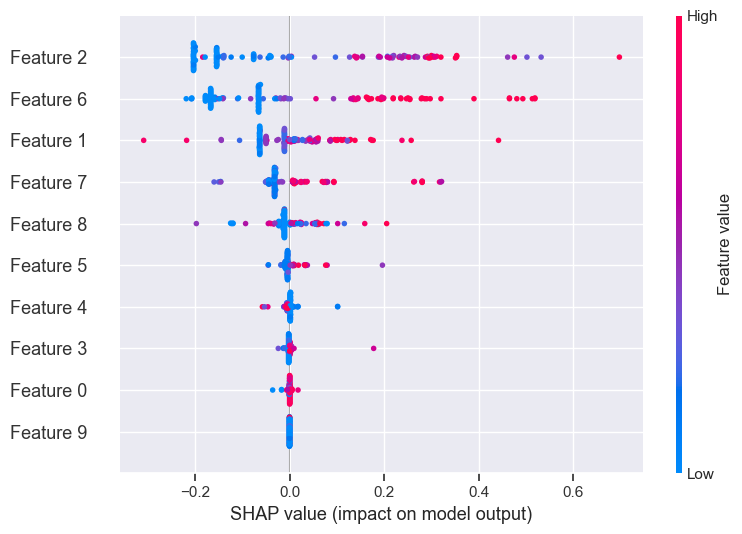

In [ ]:
shap.summary_plot(values, X_test)

In [ ]:
shap.force_plot(tree_shap_values.expected_value,values,X_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
log=LogisticRegression(random_state=0)
log.fit(X_train,Y_train)

LogisticRegression(random_state=0)

In [ ]:
log_shap_values = shap.KernelExplainer(log.predict,X_test)

Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [ ]:
values=log_shap_values.shap_values(X_test)

  0%|          | 0/140 [00:00<?, ?it/s]

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


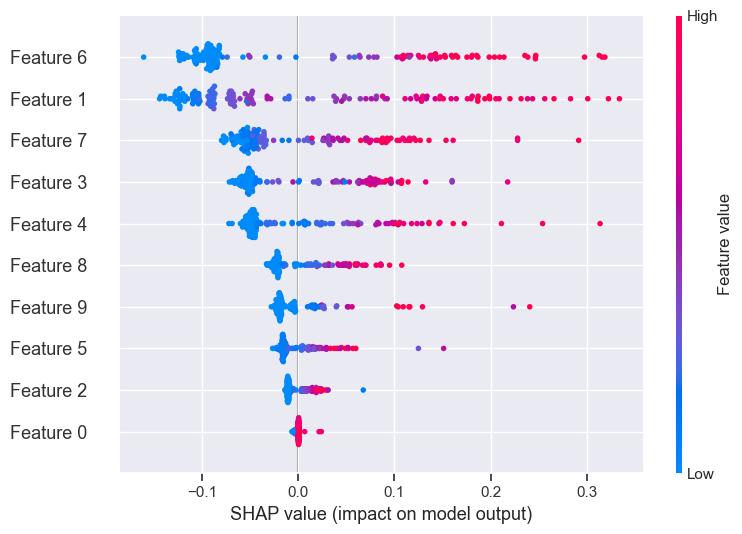

In [ ]:
shap.summary_plot(values, X_test)

In [ ]:
shap.force_plot(log_shap_values.expected_value,values,X_test)

In [ ]:
from sklearn.naive_bayes import GaussianNB
gnb=GaussianNB()
gnb.fit(X_train,Y_train)

GaussianNB()

In [ ]:
gnb_shap_values = shap.KernelExplainer(gnb.predict,X_test)

Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [ ]:
values=gnb_shap_values.shap_values(X_test)

  0%|          | 0/140 [00:00<?, ?it/s]

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


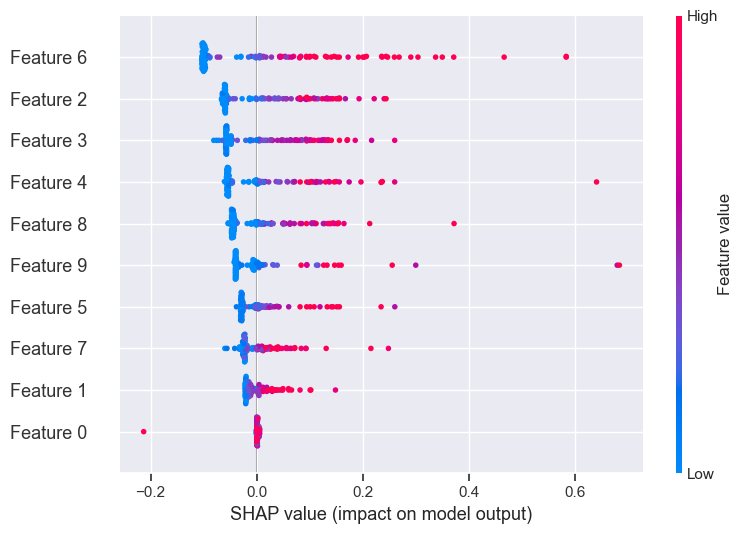

In [ ]:
shap.summary_plot(values, X_test)

In [ ]:
shap.force_plot(gnb_shap_values.expected_value,values,X_test)

In [ ]:
from sklearn.svm import SVC
svc = SVC(kernel='linear')
svc.fit(X_train, Y_train)

SVC(kernel='linear')

In [ ]:
svc_shap_values = shap.KernelExplainer(svc.predict,X_test)

Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [ ]:
values=svc_shap_values.shap_values(X_test)

  0%|          | 0/140 [00:00<?, ?it/s]

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


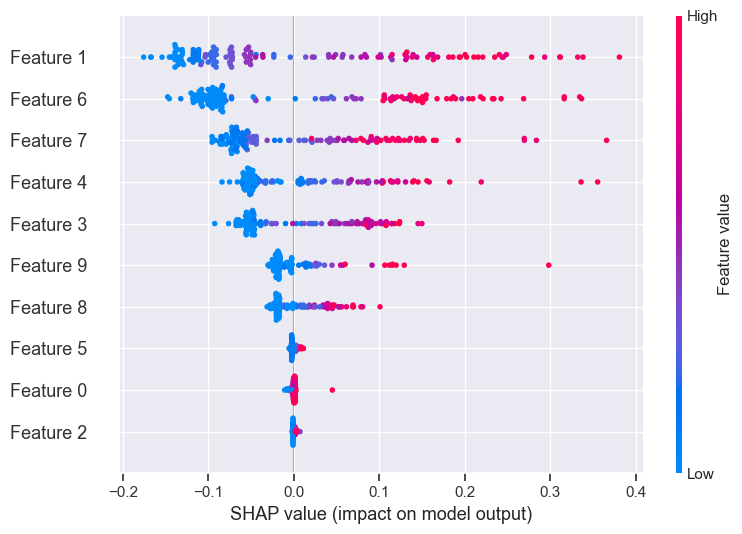

In [ ]:
shap.summary_plot(values, X_test)

In [ ]:
shap.force_plot(svc_shap_values.expected_value,values,X_test)

# **LIME**

In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283839 sha256=5dc0ed9f8eaf477a14448c5ac360d97c759e2d3a5dc679f41cd146671a3d743c
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
import lime.lime_tabular

In [ ]:
path='breast Cancer DataSet.csv'

In [ ]:
df=pd.read_csv(path)

In [ ]:
X=df.drop('Class',axis=1)
X=X.drop('Sample code number',axis=1)
Y=df['Class']
X=X.replace('?',0)
Y=Y.replace([2,4],[0,1])
for col in X.columns:
    X[col] = pd.to_numeric(X[col],errors='coerce')
    X[col] = X[col].fillna(0)

**Decision Tree**

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.20,random_state=0)

In [ ]:
clf = DecisionTreeClassifier(random_state=0)
clf.fit(X_train,Y_train)
clf_pred=clf.predict(X_test)
score = clf.score(X_test,Y_test)

In [ ]:
score

0.9714285714285714

In [ ]:
import lime
from lime import lime_tabular
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['Malignant', 'Benign'],
    mode='classification')

In [ ]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[50],
    predict_fn=clf.predict_proba)
exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [ ]:
X_test.iloc[2]

Clump Thickness                6
Uniformity of Cell Size        6
Uniformity of Cell Shape       6
Marginal Adhesion              9
Single Epithelial Cell Size    6
Bare Nuclei                    0
Bland Chromatin                7
Normal Nucleoli                8
Mitoses                        1
Name: 40, dtype: int64

**random forest**


In [ ]:
#random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(random_state=0)
model.fit(X_train, Y_train)
score = model.score(X_test, Y_test)

In [ ]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns,
    class_names=['Malignant', 'Benign'],
    mode='classification')

In [ ]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[50],
    predict_fn=model.predict_proba)
exp.show_in_notebook(show_table=True,show_all=False)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


**logistic regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(random_state=42)
model.fit(X_train, Y_train)
score = model.score(X_test, Y_test)

In [ ]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns,
    class_names=['Malignant', 'Benign'],
    mode='classification')

In [ ]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[50],
    predict_fn=model.predict_proba)
exp.show_in_notebook(show_table=True,show_all=False)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


**Gaussian Naive Bayes**

In [ ]:
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model.fit(X_train, Y_train)
score = model.score(X_test, Y_test)

In [ ]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns,
    class_names=['Malignant', 'Benign'],
    mode='classification')

In [ ]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[50],
    predict_fn=model.predict_proba)
exp.show_in_notebook(show_table=True,show_all=False)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


**SVM**

In [ ]:
from sklearn.svm import SVC
model = SVC(kernel='linear',probability=True)
model.fit(X_train, Y_train)
score = model.score(X_test, Y_test)

In [ ]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns,
    class_names=['Malignant', 'Benign'],
    mode='classification')

In [ ]:
proba = model.predict_proba(X_test)
exp = explainer.explain_instance(
    data_row=X_test.iloc[50],
    predict_fn=model.predict_proba)
exp.show_in_notebook(show_table=True,show_all=False)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


# **CNN**



In [ ]:
!pip install tensorflow-gpu==2.3.0-rc0


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement tensorflow-gpu==2.3.0-rc0 (from versions: 2.8.0rc0, 2.8.0rc1, 2.8.0, 2.8.1, 2.8.2, 2.8.3, 2.8.4, 2.9.0rc0, 2.9.0rc1, 2.9.0rc2, 2.9.0, 2.9.1, 2.9.2, 2.9.3, 2.10.0rc0, 2.10.0rc1, 2.10.0rc2, 2.10.0rc3, 2.10.0, 2.10.1, 2.11.0rc0, 2.11.0rc1, 2.11.0rc2, 2.11.0, 2.12.0)
ERROR: No matching distribution found for tensorflow-gpu==2.3.0-rc0


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.layers import Conv1D, MaxPool1D,Input

from tensorflow.keras.optimizers import Adam

In [ ]:
import pandas as pd
import numpy as np
import  seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
from sklearn import datasets, metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [ ]:
path = "breastCancer dataSet.csv"
df = pd.read_csv(path)
X=df.drop('Class',axis=1)
X=X.drop('Sample code number',axis=1)
Y=df['Class']
for col in X.columns:
    X[col] = pd.to_numeric(X[col],errors='coerce')
X = X.fillna(0)
Y=Y.replace([2,4],[0,1])

In [ ]:
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score

### **Building the CNN model**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 0, stratify = Y)

In [ ]:
X_test.shape

(140, 9)

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
X_train = X_train.reshape(559, 9,1)
X_test = X_test.reshape(140, 9, 1)

In [ ]:
epochs = 10
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape = (9,1)))
model.add(BatchNormalization())
model.add(Dropout(0.2))

model.add(Conv1D(filters=128, kernel_size=2, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 8, 64)             192       
                                                                 
 batch_normalization (BatchN  (None, 8, 64)            256       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 8, 64)             0         
                                                                 
 conv1d_1 (Conv1D)           (None, 7, 128)            16512     
                                                                 
 batch_normalization_1 (Batc  (None, 7, 128)           512       
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 7, 128)            0

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.00005), loss = 'binary_crossentropy', metrics=['accuracy'])

In [ ]:
history = model.fit(X_train, y_train, epochs=epochs, validation_data=(X_test, y_test), verbose=1)

Epoch 1/10
18/18 [==============================] - 2s 24ms/step - loss: 0.7569 - accuracy: 0.6530 - val_loss: 0.6194 - val_accuracy: 0.9643
Epoch 2/10
18/18 [==============================] - 0s 11ms/step - loss: 0.3604 - accuracy: 0.8694 - val_loss: 0.5480 - val_accuracy: 0.9429
Epoch 3/10
18/18 [==============================] - 0s 9ms/step - loss: 0.2497 - accuracy: 0.9106 - val_loss: 0.4844 - val_accuracy: 0.9214
Epoch 4/10
18/18 [==============================] - 0s 11ms/step - loss: 0.2413 - accuracy: 0.9267 - val_loss: 0.4299 - val_accuracy: 0.9143
Epoch 5/10
18/18 [==============================] - 0s 9ms/step - loss: 0.1777 - accuracy: 0.9463 - val_loss: 0.3834 - val_accuracy: 0.9214
Epoch 6/10
18/18 [==============================] - 0s 10ms/step - loss: 0.1771 - accuracy: 0.9481 - val_loss: 0.3446 - val_accuracy: 0.9071
Epoch 7/10
18/18 [==============================] - 0s 10ms/step - loss: 0.1559 - accuracy: 0.9517 - val_loss: 0.3098 - val_accuracy: 0.9000
Epoch 8/10
18/1

In [ ]:
pred = model.predict(X_test)

5/5 [==============================] - 0s 4ms/step


In [ ]:
pred = list(pd.DataFrame(pred).round().astype(int)[0])

In [ ]:
print ('Accuracy:', accuracy_score(pred, y_test))
print( 'F1 score:', f1_score(pred,y_test))
print( 'Recall:', recall_score(pred,y_test))
print( 'Precision:', precision_score(pred,y_test))
print( '\n clasification report:\n', classification_report(pred,y_test))
print( '\n confussion matrix:\n',confusion_matrix(pred,y_test))

Accuracy: 0.9071428571428571
F1 score: 0.8470588235294119
Recall: 0.972972972972973
Precision: 0.75

 clasification report:
               precision    recall  f1-score   support

           0       0.99      0.88      0.93       103
           1       0.75      0.97      0.85        37

    accuracy                           0.91       140
   macro avg       0.87      0.93      0.89       140
weighted avg       0.93      0.91      0.91       140


 confussion matrix:
 [[91 12]
 [ 1 36]]


In [ ]:
def plot_learningCurve(history, epoch):
  # Plot training & validation accuracy values
  epoch_range = range(1, epoch+1)
  plt.plot(epoch_range, history.history['accuracy'])
  plt.plot(epoch_range, history.history['val_accuracy'])
  plt.title('Model accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Val'], loc='upper left')
  plt.show()

  # Plot training & validation loss values
  plt.plot(epoch_range, history.history['loss'])
  plt.plot(epoch_range, history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Val'], loc='upper left')
  plt.show()

In [ ]:
history.history

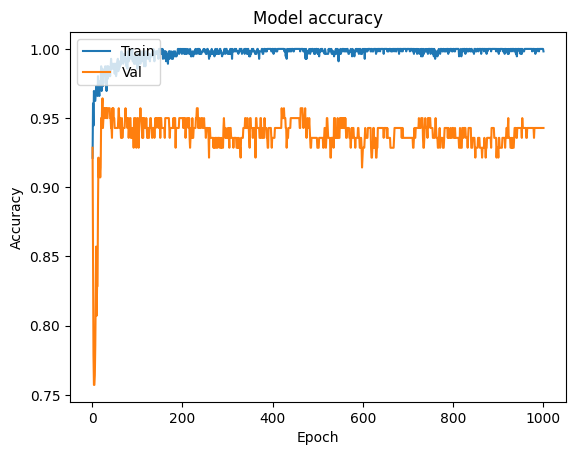

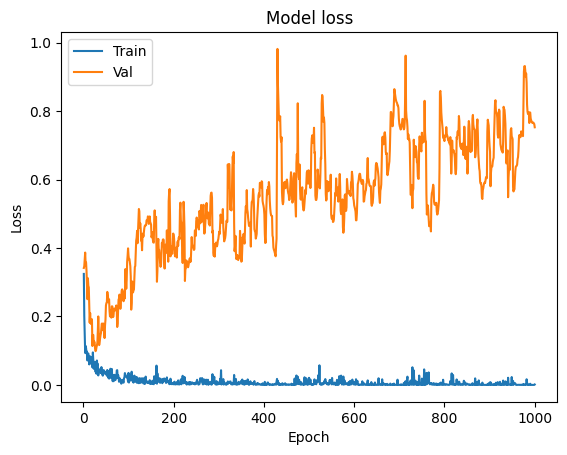

In [ ]:
plot_learningCurve(history, epochs)

In [ ]:
import shap

In [ ]:
explainer = shap.KernelExplainer(model.predict,np.array(X_test))

5/5 [==============================] - 0s 4ms/step


In [ ]:
shap_values = explainer.shap_values(np.array(X_test))

AssertionError: ignored

### **FFNN**

In [ ]:
import pandas as pd
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split

In [ ]:
import  seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
from sklearn import datasets, metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [ ]:
path = "breastCancer dataSet.csv"
df = pd.read_csv(path)
X=df.drop('Class',axis=1)
X=X.drop('Sample code number',axis=1)
Y=df['Class']
for col in X.columns:
    X[col] = pd.to_numeric(X[col],errors='coerce')
X = X.fillna(0)
Y=Y.replace([2,4],[0,1])

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X,Y,test_size=0.3)

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(x_train)
X_test = scaler.transform(x_test)

In [ ]:
X_test.shape

(210, 9)

In [ ]:
# X_train = X_train.reshape(489, 9,1)
# X_test = X_test.reshape(210, 9, 1)

In [ ]:
model_better = keras.Sequential([
    keras.layers.Input(shape=(9,)),
    keras.layers.Dense(64, input_shape=(9,), activation='relu'),
    keras.layers.Dense(32, activation='sigmoid'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(256, activation='sigmoid'),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='sigmoid'),
    keras.layers.Dense(32, activation='sigmoid'),
    keras.layers.Dense(16, activation='relu'),
    keras.layers.Dense(2, activation='softmax')
])

# Compiling the model
model_better.compile(optimizer='adam',
                     loss=keras.losses.SparseCategoricalCrossentropy(),
                     metrics=['accuracy'])

# Constructing the input
# x = np.column_stack((train.x.values, train.y.values))
# y = train.color.values

# fitting the model

history = model_better.fit(X_train,y_train,validation_data=(X_test, y_test), epochs=10, batch_size=10)

Epoch 1/10
49/49 [==============================] - 4s 11ms/step - loss: 0.5872 - accuracy: 0.7014 - val_loss: 0.2727 - val_accuracy: 0.9714
Epoch 2/10
49/49 [==============================] - 0s 5ms/step - loss: 0.1831 - accuracy: 0.9632 - val_loss: 0.1060 - val_accuracy: 0.9714
Epoch 3/10
49/49 [==============================] - 0s 6ms/step - loss: 0.1453 - accuracy: 0.9652 - val_loss: 0.1098 - val_accuracy: 0.9714
Epoch 4/10
49/49 [==============================] - 0s 5ms/step - loss: 0.1428 - accuracy: 0.9632 - val_loss: 0.0942 - val_accuracy: 0.9762
Epoch 5/10
49/49 [==============================] - 0s 6ms/step - loss: 0.1146 - accuracy: 0.9693 - val_loss: 0.0929 - val_accuracy: 0.9714
Epoch 6/10
49/49 [==============================] - 0s 6ms/step - loss: 0.1221 - accuracy: 0.9673 - val_loss: 0.1002 - val_accuracy: 0.9762
Epoch 7/10
49/49 [==============================] - 0s 5ms/step - loss: 0.1221 - accuracy: 0.9652 - val_loss: 0.0960 - val_accuracy: 0.9714
Epoch 8/10
49/49 [=

In [ ]:
pred = model_better.predict(X_test)

7/7 [==============================] - 0s 8ms/step


In [ ]:
pred = list(pd.DataFrame(pred).round().astype(int)[1])

In [ ]:
print ('Accuracy:', accuracy_score(pred, y_test))
print( 'F1 score:', f1_score(pred,y_test))
print( 'Recall:', recall_score(pred,y_test))
print( 'Precision:', precision_score(pred,y_test))
print( '\n clasification report:\n', classification_report(pred,y_test))
print( '\n confussion matrix:\n',confusion_matrix(pred,y_test))

Accuracy: 0.9761904761904762
F1 score: 0.9624060150375939
Recall: 0.927536231884058
Precision: 1.0

 clasification report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98       141
           1       1.00      0.93      0.96        69

    accuracy                           0.98       210
   macro avg       0.98      0.96      0.97       210
weighted avg       0.98      0.98      0.98       210


 confussion matrix:
 [[141   0]
 [  5  64]]


In [ ]:
import shap

In [ ]:
explainer = shap.KernelExplainer(model_better.predict,shap.sample(np.array(X_test)))

4/4 [==============================] - 0s 3ms/step


In [ ]:
shap_values = explainer.shap_values(np.array(X_test))

### **RNN**

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split

In [ ]:
path = "breastCancer dataSet.csv"
df = pd.read_csv(path)
X=df.drop('Class',axis=1)
X=X.drop('Sample code number',axis=1)
Y=df['Class']
for col in X.columns:
    X[col] = pd.to_numeric(X[col],errors='coerce')
X = X.fillna(0)
Y=Y.replace([2,4],[0,1])

In [ ]:
x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size=0.3,random_state=40)

In [ ]:
# x_train = x_train.values.reshape(len(x_train),1,9)
# x_test = x_test.values.reshape(len(x_test),1,9)
x_train=np.asarray(x_train).astype(int)
x_test=np.asarray(x_test).astype(int)
y_train=np.asarray(y_train).astype(int)
y_test=np.asarray(y_test).astype(int)

In [ ]:
x_train.shape

(489, 9)

In [ ]:
x_train=tf.convert_to_tensor(x_train)
x_test=tf.convert_to_tensor(x_test)
y_train=tf.convert_to_tensor(y_train)
y_test=tf.convert_to_tensor(y_test)

In [ ]:
model = keras.Sequential()
model.add(layers.Embedding(input_dim=1000, output_dim=64))

#lstm layer
model.add(layers.LSTM(128, input_shape=(None,9), return_sequences=True))

# The output of GRU will be a 3D tensor of shape (batch_size, timesteps, 256)
model.add(layers.GRU(256, return_sequences=True))


# The output of SimpleRNN will be a 2D tensor of shape (batch_size, 128)
model.add(layers.SimpleRNN(128))

model.add(layers.Dense(2))

model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 64)          64000     
                                                                 
 lstm (LSTM)                 (None, None, 128)         98816     
                                                                 
 gru (GRU)                   (None, None, 256)         296448    
                                                                 
 simple_rnn (SimpleRNN)      (None, 128)               49280     
                                                                 
 dense_52 (Dense)            (None, 2)                 258       
                                                                 
Total params: 508,802
Trainable params: 508,802
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(optimizer='adam', loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.fit(x_train, y_train, validation_data=(x_test, y_test), batch_size=100, epochs=5)

Epoch 1/5
5/5 [==============================] - 7s 335ms/step - loss: 1.3812 - accuracy: 0.7546 - val_loss: 0.4027 - val_accuracy: 0.8905
Epoch 2/5
5/5 [==============================] - 1s 104ms/step - loss: 0.3798 - accuracy: 0.7771 - val_loss: 0.1810 - val_accuracy: 0.9524
Epoch 3/5
5/5 [==============================] - 1s 112ms/step - loss: 0.1808 - accuracy: 0.9591 - val_loss: 0.2425 - val_accuracy: 0.9476
Epoch 4/5
5/5 [==============================] - 1s 110ms/step - loss: 0.1945 - accuracy: 0.9673 - val_loss: 0.2243 - val_accuracy: 0.9619
Epoch 5/5
5/5 [==============================] - 1s 106ms/step - loss: 0.1784 - accuracy: 0.9714 - val_loss: 0.4204 - val_accuracy: 0.9524


In [ ]:
pred = model.predict(x_test)

7/7 [==============================] - 41s 14ms/step


In [ ]:
pred

array([[ 3.97253990e-01, -3.64338607e-01],
       [ 7.64610171e-02,  1.84131771e-01],
       [-1.73161596e-01,  7.44766653e-01],
       [ 3.08024108e-01, -2.12840796e-01],
       [ 5.30699492e-01, -5.65753281e-01],
       [ 4.33823109e-01, -3.88318956e-01],
       [ 4.77521837e-01, -4.93868172e-01],
       [ 6.63755894e-01, -7.76432812e-01],
       [ 3.96414340e-01, -2.06553876e-01],
       [ 2.63761729e-01, -2.96863653e-02],
       [ 5.24071097e-01, -5.12195349e-01],
       [ 6.11152291e-01, -7.23768532e-01],
       [-3.98430586e-01,  9.72954631e-01],
       [ 5.40445328e-01, -5.95138550e-01],
       [ 4.31110293e-01, -2.86092758e-01],
       [ 4.77521837e-01, -4.93868172e-01],
       [-1.16753563e-01,  6.30634964e-01],
       [ 4.68713492e-01, -4.88120079e-01],
       [ 5.12969673e-01, -4.63223726e-01],
       [ 4.31110293e-01, -2.86092758e-01],
       [-2.29710080e-02,  4.62429762e-01],
       [-1.68956965e-01,  6.16058707e-01],
       [ 5.16758561e-01, -4.90013242e-01],
       [-1.

In [ ]:
# !pip install shap
import shap
shap.initjs()

In [ ]:
explainer = shap.KernelExplainer(model.predict,shap.sample(np.array(x_test)))

4/4 [==============================] - 0s 38ms/step


In [ ]:
shap_values = explainer.shap_values(np.array(x_test), nsamples=500)